In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as  np
from scipy import signal
import scipy

In [42]:
data_path = "..\\Datasets\\Forecasting_aqua\\data_h_V2.csv"
format = "%d/%m/%Y"
df = pd.read_csv(data_path)
date_df = pd.to_datetime(df["date"], format=format)
df['date']= date_df
h_df = pd.to_timedelta(df["hour"],unit='h')
df['Datetime']=date_df+h_df
df['mean_par_depth']=df['mean(PAR, na.rm = T)'] #rename strange column
df.drop(columns=['date','hour','sample','mean_phy_depth',
                 'cv_phy','mean_phycoer_depth','cv_phycoer',
                 'mean(PAR, na.rm = T)','TOC','cv_turb','filament'
                ],inplace=True,errors='ignore')


In [45]:
for key in df.keys():
    print("'"+key+"',")

'mean_temp_depth',
'cv_temp',
'mean_condF_depth',
'cv_condF',
'mean_o2_depth',
'cv_o2',
'mean_o2ppm_depth',
'cv_o2ppm',
'mean_ph_depth',
'cv_ph',
'mean_chla_depth',
'cv_chla',
'mean_turb_depth',
'mean_par_depth',
'cv_par',
'mean_cloud_cover',
'mean_global_radiation',
'atmospheric_pressure_max',
'atmospheric_pressure_min',
'atmospheric_pressure_mean',
'temp_max',
'temp_min',
'temp_mean',
'precipitation_tot',
'rel_air_humidity_max',
'rel_air_humidity_min',
'rel_air_humidity_mean',
'sunshine_duration',
'windspeed_mean',
'windspeed_max',
'wind_direction_mean',
'mean_global_radiation_GR',
'atmospheric_pressure_max_GR',
'atmospheric_pressure_min_GR',
'atmospheric_pressure_mean_GR',
'temp_max_GR',
'temp_min_GR',
'temp_mean_GR',
'precipitation_tot_GR',
'rel_air_humidity_max_GR',
'rel_air_humidity_min_GR',
'rel_air_humidity_mean_GR',
'windspeed_mean_GR',
'windspeed_max_GR',
'wind_direction_mean_GR',
'Nitrat',
'Nitrit',
'Ammonium',
'oP',
'TP',
'TN',
'thermocline',
'schmidt_stability',
'epi_temp'

In [46]:
dfi['Datetime']

KeyError: 'Datetime'

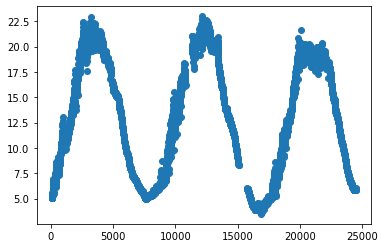

In [47]:
plt.scatter(df.index,df['mean_temp_depth'])

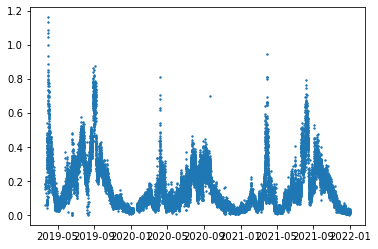

In [48]:
key = 'cluster_1'
plt.scatter(df['Datetime'],df[key],s=2)

In [49]:
dft = df.set_index('Datetime')

In [50]:
dft

,mean_temp_depth,cv_temp,mean_condF_depth,cv_condF,mean_o2_depth,cv_o2,mean_o2ppm_depth,cv_o2ppm,mean_ph_depth,cv_ph,...,cluster_1,cluster_2,cluster_3,cluster_4,cluster_5,cluster_6,cluster_7,cluster_8,diatom,ciliate
Datetime,,,,,,,,,,,,,,,,,,,,,
2019-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-01-02 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-01-03 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-01-04 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-01-05 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-31 19:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-12-31 20:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-12-31 21:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [51]:
dfclean = dft.groupby(dft.index).transform('mean')
dfclean.drop_duplicates(inplace=True)

In [52]:
#resample the data:
dfs = dfclean.asfreq('1H')

In [53]:
#the log is taken on some variables
key_log = ['mean_chla_depth','mean_par_depth','asplanchna','asterionella',
           'brachionus','diatom_chain','dinobryon','dirt','eudiaptomus','filament','kellikottia',
           'keratella_quadrata','maybe_cyano','nauplius','polyarthra','rotifers','synchaeta','unknown',
           'unknown_plankton','ceratium','cyclops','fragilaria','keratella_cochlearis','paradileptus','bosmina',
           'copepod_skins','daphnia','trichocerca','conochilus','diaphanosoma','fish','uroglena','leptodora',
           'daphnia_skins','hydra','chaoborus','aphanizomenon','cluster_1','cluster_2','cluster_3','cluster_4',
           'cluster_5','cluster_6','cluster_7','cluster_8','diatom','ciliate']
dflog = dfs.copy()
dflog[key_log]=np.log(dfs[key_log]+1e-9)
#As the results look horrible, this method was abandonned

KeyError: "['filament'] not in index"

In [54]:
dfr = dfs.rolling('1D').mean()
dfi = dfs.interpolate(method = 'linear',limit_area='inside')
dfi = dfi.rolling('1D').mean()

In [55]:
dfc = dfr.interpolate(method='ffill')

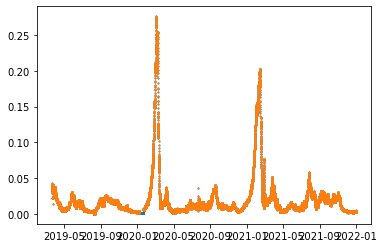

In [56]:
key = 'diatom'
#plt.scatter(df['Datetime'],df[key],s=1)

#plt.scatter(dfi.index,dfi[key],s=1)
plt.scatter(dfc.index,dfc[key],s=1)
plt.scatter(dfr.index,dfr[key],s=1)

In [57]:
dfr.keys()

Index(['mean_temp_depth', 'cv_temp', 'mean_condF_depth', 'cv_condF',
       'mean_o2_depth', 'cv_o2', 'mean_o2ppm_depth', 'cv_o2ppm',
       'mean_ph_depth', 'cv_ph',
       ...
       'cluster_1', 'cluster_2', 'cluster_3', 'cluster_4', 'cluster_5',
       'cluster_6', 'cluster_7', 'cluster_8', 'diatom', 'ciliate'],
      dtype='object', length=101)

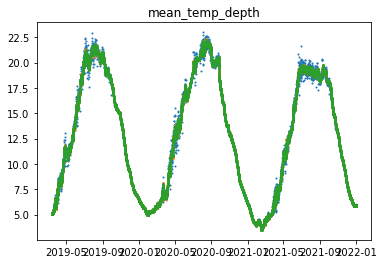

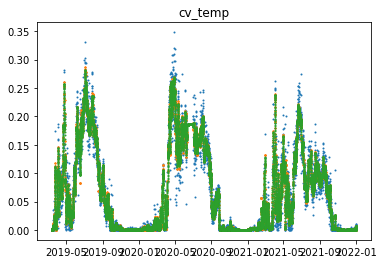

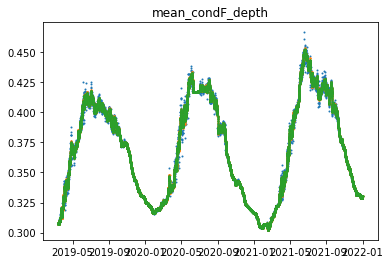

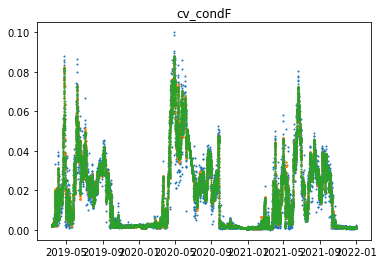

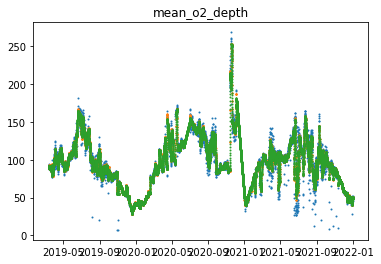

...

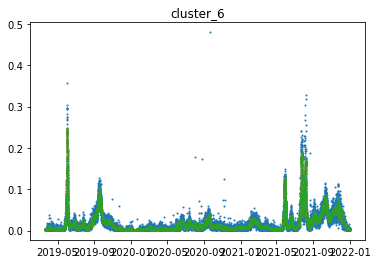

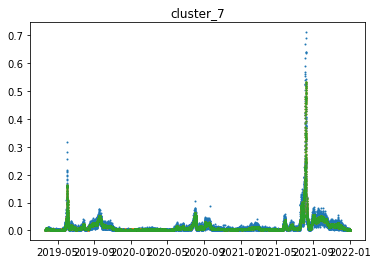

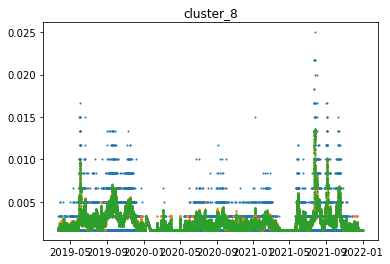

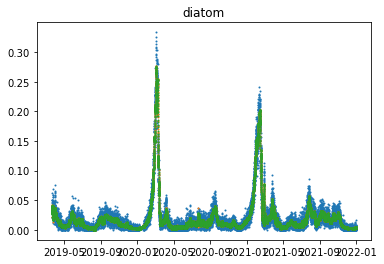

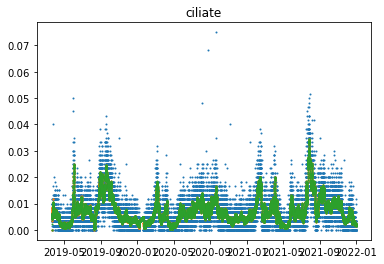

In [58]:
for key in dfr.keys():
    plt.scatter(df['Datetime'],df[key],s=1)
    plt.scatter(dfr.index,dfr[key],s=1)
    plt.scatter(dfi.index,dfi[key],s=1)
    plt.title(key)
    plt.show()

A daily rolling average of the data seems to be a good way to get rid of part of the noise, without loosing too much information. Moreover, this automatically fill up nans as long as some data are available during the day.

In [59]:
dfs.to_csv("..\\Datasets\\Forecasting_aqua\\data_h_clean_v3.csv",na_rep='NA')
dfr.to_csv("..\\Datasets\\Forecasting_aqua\\data_h_rolling_v3.csv",na_rep='NA')
dfi.to_csv("..\\Datasets\\Forecasting_aqua\\data_h_rolling_interpolated_v3.csv",na_rep='NA')
dfc.to_csv("..\\Datasets\\Forecasting_aqua\\data_h_rolling_cst_int_v3.csv",na_rep='NA')


In [80]:
df = dfc
key = 'mean_chla_depth'

In [60]:
dfs.shape

(26304, 101)

In [81]:
msg = "the different keys are:\n"
for key in df.keys():
    msg+= "-"+key+"\n"
print(msg)

the different keys are:
-mean_temp_depth
-cv_temp
-mean_condF_depth
-cv_condF
-mean_o2_depth
-cv_o2
-mean_o2ppm_depth
-cv_o2ppm
-mean_ph_depth
-cv_ph
-mean_chla_depth
-cv_chla
-mean_turb_depth
-mean_par_depth
-cv_par
-mean_cloud_cover
-mean_global_radiation
-atmospheric_pressure_max
-atmospheric_pressure_min
-atmospheric_pressure_mean
-temp_max
-temp_min
-temp_mean
-precipitation_tot
-rel_air_humidity_max
-rel_air_humidity_min
-rel_air_humidity_mean
-sunshine_duration
-windspeed_mean
-windspeed_max
-wind_direction_mean
-mean_global_radiation_GR
-atmospheric_pressure_max_GR
-atmospheric_pressure_min_GR
-atmospheric_pressure_mean_GR
-temp_max_GR
-temp_min_GR
-temp_mean_GR
-precipitation_tot_GR
-rel_air_humidity_max_GR
-rel_air_humidity_min_GR
-rel_air_humidity_mean_GR
-windspeed_mean_GR
-windspeed_max_GR
-wind_direction_mean_GR
-Nitrat
-Nitrit
-Ammonium
-oP
-TP
-TN
-thermocline
-schmidt_stability
-epi_temp
-mixed_layer_depth
-ml_irradiance
-oxycline_depth
-asplanchna
-asterionella
-brach

In [82]:
df['year'] = df.index.year
df['month'] = df.index.month
df['day'] = df.index.day
df['hour']=df.index.hour

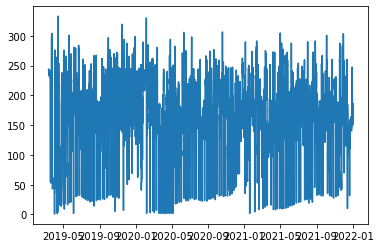

In [84]:
plt.plot(dfc['Nitrit'])

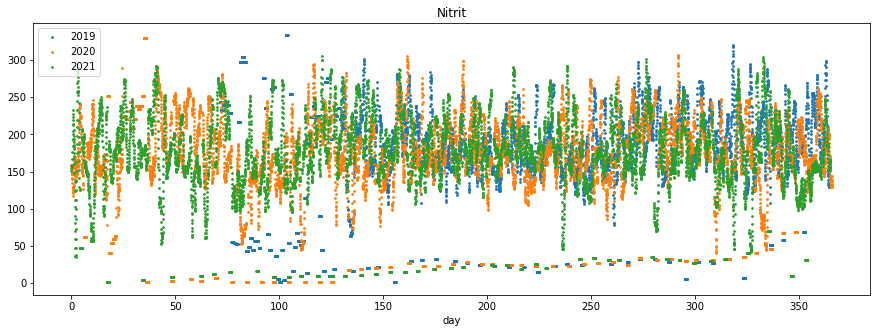

In [83]:
key = 'Nitrit'
fig,ax = plt.subplots(1,figsize=(15,5))

years = df['year'].unique()
for year in years:
    dfy = df[df['year']==year]
    yeardt = np.datetime64(str(year),'Y')
    dt = (dfy.index-yeardt).days +(dfy.index-yeardt).seconds/3600/24
    ax.scatter(dt,dfy[key],s=3)
ax.legend([str(year) for year in years])
ax.set_title(key)
ax.set_xlabel("day")
plt.show()

C:\Users\valla\AppData\Local\Temp\ipykernel_8564\4215136516.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax = plt.subplots(1,figsize=(15,5))


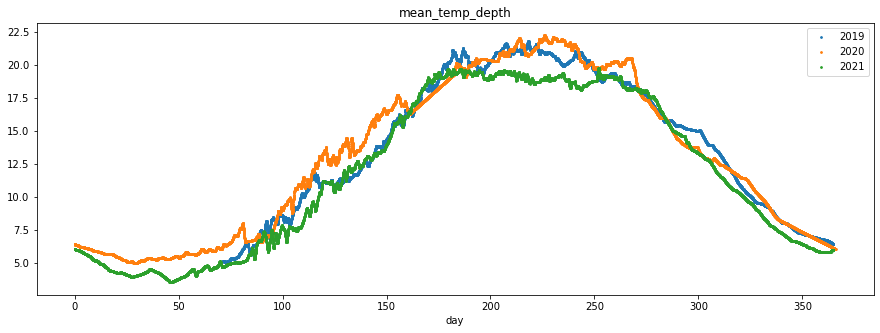

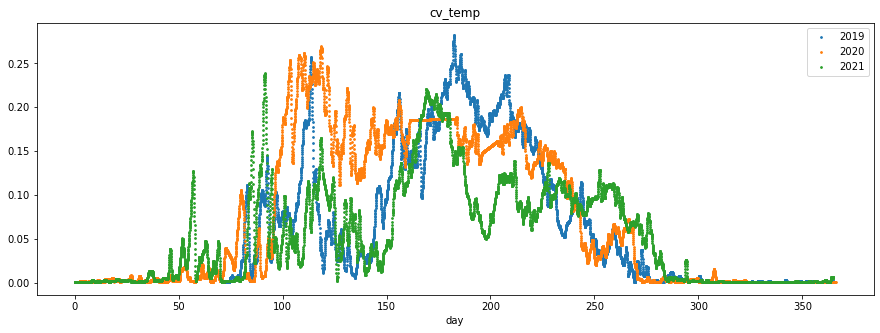

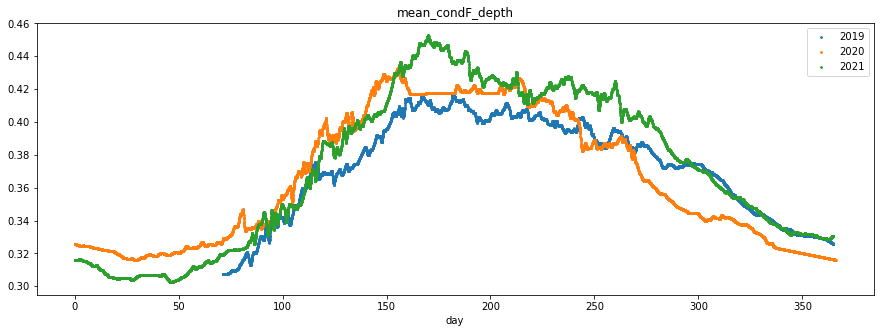

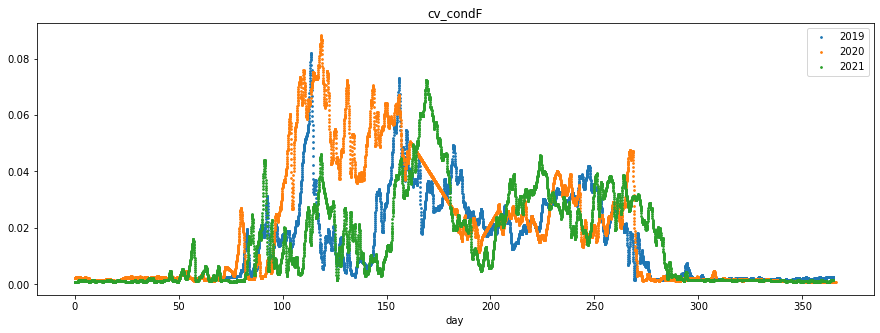

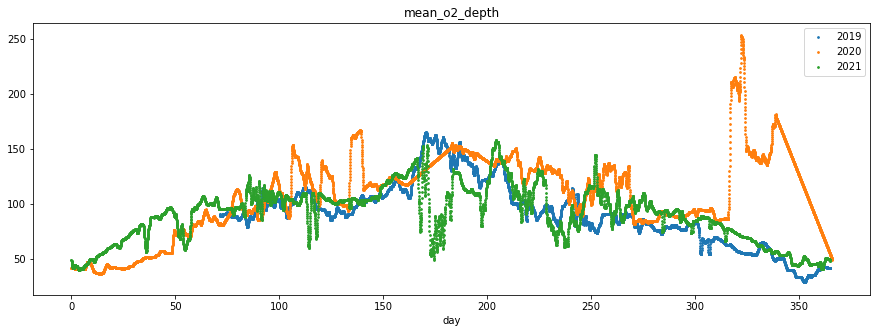

...

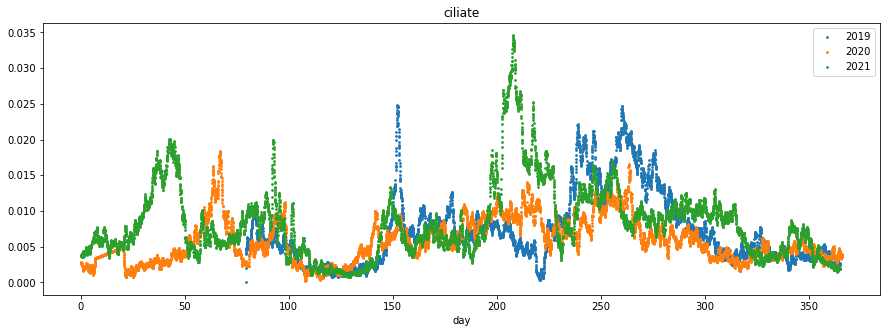

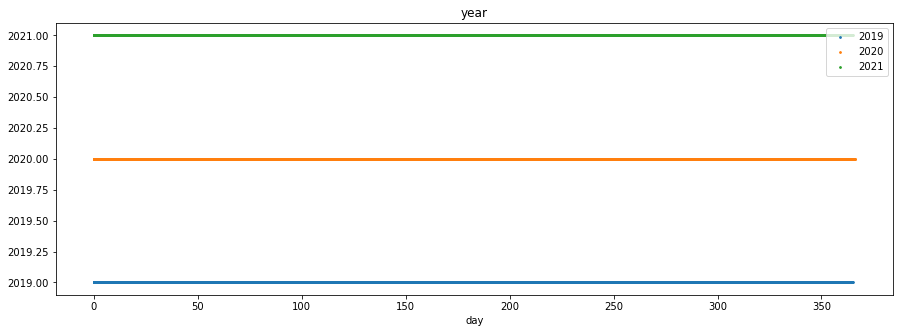

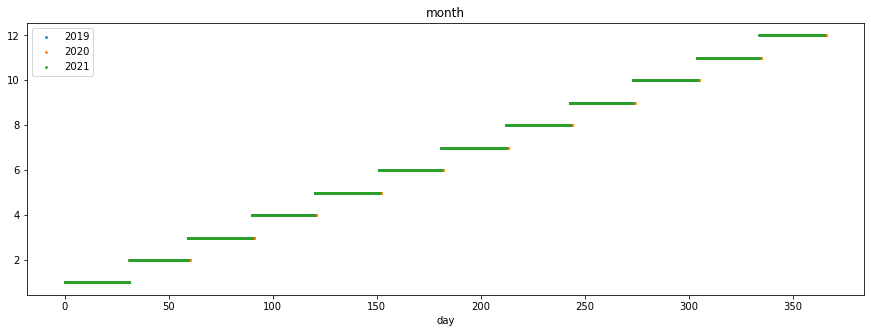

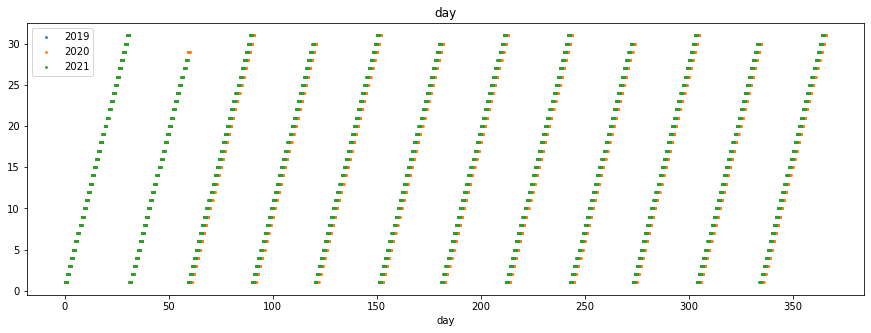

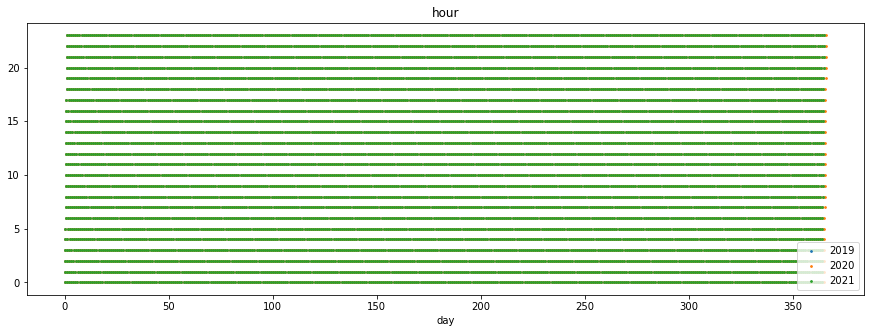

In [354]:
from matplotlib.backends.backend_pdf import PdfPages
pp = PdfPages('variables_h.pdf')

years = df['year'].unique()
for key in df.keys():
    fig,ax = plt.subplots(1,figsize=(15,5))
    for year in years:
        dfy = df[df['year']==year]
        yeardt = np.datetime64(str(year),'Y')
        dt = (dfy.index-yeardt).days +(dfy.index-yeardt).seconds/3600/24
        ax.scatter(dt,dfy[key],s=3)
    ax.legend([str(year) for year in years])
    ax.set_title(key)
    ax.set_xlabel("day")
    pp.savefig()
pp.close()

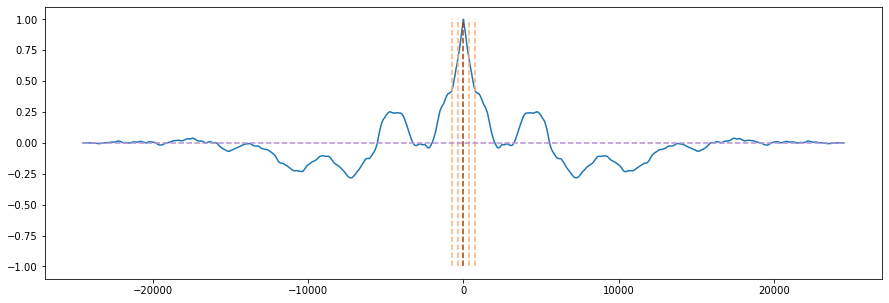

In [62]:
bins = pd.cut(serie,30)
mid = np.array([bin.mid for bin in bins])

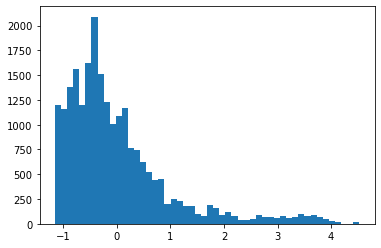

In [61]:
serie = df[key].dropna().reset_index(drop=True)
serie = (serie-serie.mean())/serie.std()
hist,bins,artists = plt.hist(serie, bins=50)
roc = serie[1:].reset_index(drop=True)-serie[:-1]

Text(0, 0.5, 'rate of change')

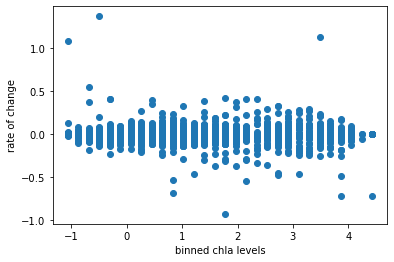

In [63]:
plt.scatter(mid[:-1],roc)
plt.xlabel('binned chla levels')
plt.ylabel('rate of change')